In [1]:
using Pkg
Pkg.activate("../../Project.toml")

using ITensors
using Plots
using Random
using Interpolations
using LegendrePolynomials

include("../RealRealH6ighDimension.jl")
include("../benchmarking/benchUtils.jl")

  Activating project at `~/Documents/QML Project/QuantumInspiredML`


get_baseKLD (generic function with 1 method)

In [3]:
encoding = Basis("Legendre")

Basis(Legendre)

In [4]:
(X_train, y_train), (X_val, y_val), (X_test, y_test) = load_splits_txt("../datasets/ECG_train.txt", 
"../datasets/ECG_val.txt", "../datasets/ECG_test.txt");
X_train = vcat(X_train, X_val);
y_train = vcat(y_train, y_val);

scaler = fit_scaler(RobustSigmoidTransform, X_train; range=encoding.range);
    X_train_scaled = transform_data(scaler, X_train)
    X_val_scaled = transform_data(scaler, X_val)
    X_test_scaled = transform_data(scaler, X_test);

## vis some mps distributions
1) plot the distribution over x at each site, tracing out all others
2) on top of one of those, plot the class one and class 2 values

In [28]:
function vis_dist(W::MPS, e::T, d::Integer; nxs=100) where {T<:Encoding}
    @assert !e.istimedependent
    a,b = e.range
    xs = range(a,b,nxs)
    x_encs = map(x->e.encode(x, d), xs)
    return vis_dist(W, e, d, xs, x_encs)
end

function vis_dist(W::MPS, e::T, d::Integer, xs::Vector{Float64}, x_encs::VecOrMat{Vector{N}}) where {T<:Encoding, N <: Number}
    dists = Vector{Float64}(undef, length(W))

    Wdag = dag(W)
    Wdagp = sim(siteinds, Wdag)
    Wdag = sim(linkinds, Wdag)

    prod = W .* Wdag;
    lcache = accumulate(*, prod)
    rcache = reverse(accumulate(*,prod[end:-1:1]))
    
    outs = []
    
    for (i, it) in enumerate(W)
        if x_encs isa Matrix #e.istimedependent
            con_xs = [ W[i] * itensor(xe, siteinds(W)[i]) for xe in x_encs[i,:]]
            con_xdags = [ Wdag[i] * dag(itensor(xe, siteinds(Wdag)[i])) for xe in x_encs[i,:]]
        else
            con_xs = [ W[i] * itensor(xe, siteinds(W)[i]) for xe in x_encs]
            con_xdags = [ Wdag[i] * dag(itensor(xe, siteinds(Wdag)[i])) for xe in x_encs]
        end
        
        if i == 1
            cache =  rcache[i+1] 
        elseif i == length(W)
            cache = lcache[i-1] 
        else
            cache = lcache[i-1] * rcache[i+1] 
        end

        tensor = map((x1,x2) -> real(first(cache * x1 * x2)), con_xs, con_xdags)
        push!(outs, tensor)
    end
    return [xs, hcat(outs...)]
end

function vis_dist(encoding::T, d::Integer, ; aux_basis_dim=2, nsweeps=5, chi_max=15, eta=0.025, update_iters=1, verbosity=0) where {T<:Encoding}

    (X_train, y_train), (X_val, y_val), (X_test, y_test) = load_splits_txt("../datasets/ECG_train.txt", 
    "../datasets/ECG_val.txt", "../datasets/ECG_test.txt");
    X_train = vcat(X_train, X_val);
    y_train = vcat(y_train, y_val);

    scaler = fit_scaler(RobustSigmoidTransform, X_train; range=encoding.range);
        X_train_scaled = transform_data(scaler, X_train)
        X_val_scaled = transform_data(scaler, X_val)
        X_test_scaled = transform_data(scaler, X_test);

    #
    dtype = encoding.iscomplex ? ComplexF64 : Float64

    opts=Options(; nsweeps=nsweeps, chi_max=chi_max,  update_iters=update_iters, verbosity=verbosity, dtype=dtype, lg_iter=KLD_iter,
    bbopt=BBOpt("CustomGD", "TSGO"), track_cost=false, eta=eta, rescale = (false, true), d=d, aux_basis_dim=aux_basis_dim, encoding=encoding)

    W, info, train_states, test_states, xs ,sample_encoding = fitMPS(X_train, y_train, X_val, y_val, X_test, y_test; random_state=456, chi_init=4, opts=opts, test_run=false, return_sample_encoding=true)
    
    
    # get the marginals
    mpss, l_ind = expand_label_index(W);

    # downsample a bit to save time 
    xs = xs[1:5:1000]
    sample_encoding = sample_encoding[:, 1:5:1000]

    _, outsC0 = vis_dist(mpss[1], encoding, d, xs, sample_encoding);
    _, outsC1 = vis_dist(mpss[2], encoding, d, xs, sample_encoding);

    return [xs, X_train_scaled, y_train, outsC0, outsC1, sample_encoding]


end

vis_dist (generic function with 4 methods)

In [10]:
collect(1:5:1000)

200-element Vector{Int64}:
   1
   6
  11
  16
  21
  26
  31
  36
  41
  46
   ⋮
 956
 961
 966
 971
 976
 981
 986
 991
 996

In [11]:
sencL

UndefVarError: UndefVarError: `sencL` not defined

In [12]:
# enc = Matrix{eltype(eltype(senc_f))}([transpose(hcat(senc_f[i,:]...)) for i in size(senc_f,1)][1])

# plot(xsf, real.(enc))

In [29]:
xsf, Xtrainsf, y_trainf, outsC0f, outsC1f, sencf = vis_dist(Basis("Fourier"), 2)
xsL, XtrainsL, y_trainL, outsC0L, outsC1L, sencL = vis_dist(Basis("Legendre"), 2)



Generating initial weight MPS with bond dimension χ_init = 4
        using random state 456.
Initialising train states.
Classes are not Balanced:
┌───────┬───────┐
│ Class │ Count │
├───────┼───────┤
│     0 │    31 │
│     1 │    69 │
└───────┴───────┘
Initialising valid states.
Classes are not Balanced:
┌───────┬───────┐
│ Class │ Count │
├───────┼───────┤
│     0 │     3 │
│     1 │     7 │
└───────┴───────┘
Initialising test states.
Classes are not Balanced:
┌───────┬───────┐
│ Class │ Count │
├───────┼───────┤
│     0 │    36 │
│     1 │    64 │
└───────┴───────┘
Initialising test_enc states.
Classes are not Balanced:
┌───────┬───────┐
│ Class │ Count │
├───────┼───────┤
│     0 │    31 │
│     1 │    69 │
└───────┴───────┘
Using 1 iterations per update.
Validation MSE loss: 0.5 | Validation acc. 0.6.
Training MSE loss: 0.5 | Training acc. 0.64.
Testing MSE loss: 0.5 | Testing acc. 0.67.

Validation KL Divergence: 70.73549910585422.
Training KL Divergence: 70.77204296044134.
Test 

6-element Vector{Array}:
 [-1.0, -0.98998998998999, -0.97997997997998, -0.96996996996997, -0.95995995995996, -0.94994994994995, -0.93993993993994, -0.92992992992993, -0.91991991991992, -0.9099099099099099  …  0.9019019019019019, 0.9119119119119119, 0.9219219219219219, 0.9319319319319319, 0.9419419419419419, 0.9519519519519519, 0.9619619619619619, 0.9719719719719719, 0.9819819819819819, 0.991991991991992]
 [-0.2141544548310621 -0.5969859761991643 … 0.36647645498124626 0.3888753108520462; 0.47632277389242894 0.9370596254987829 … -0.06453787936261213 0.04931970773221739; … ; 0.14338051625784431 0.16372869042913418 … 0.24905905094306768 0.10846194609053472; 0.2079838219974357 0.7708775915462436 … -0.3543696459912383 -0.23286450396021674]
 [0, 0, 1, 1, 1, 1, 1, 1, 0, 1  …  1, 0, 1, 0, 1, 1, 1, 1, 0, 1]
 [0.2732266024851462 0.17004682710065927 … 0.3103738837931482 0.2971532374154615; 0.2607394060251061 0.16147014763948955 … 0.29531713620895683 0.2818573660340437; … ; 0.12534320833009693 0.22

In [24]:
print("123")
print("\b")

123

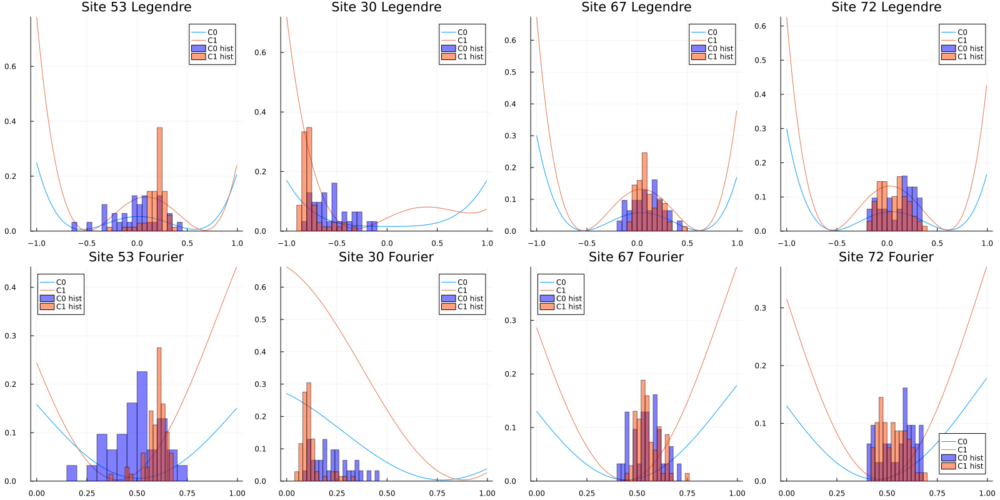

In [30]:
sites = sample(1:96, 4)
p1s = []
p2s = []
for siteid in sites
    bins=20
    distC0L = outsC0L[:,siteid]
    distC1L = outsC1L[:,siteid]

    dpointsL = XtrainsL[:, siteid]

    distC0f = outsC0f[:,siteid]
    distC1f = outsC1f[:,siteid]

    dpointsf = Xtrainsf[:, siteid]
    
    p1 = plot(xsL, distC0L, label="C0", title="Site $siteid Legendre") 
    plot!(xsL, distC1L, label="C1") 
    histogram!(dpointsL[y_trainL .== 0], norm=:probability, alpha=0.5, bins=bins, label="C0 hist", color=:blue)
    histogram!(dpointsL[y_trainL .== 1], norm=:probability, alpha=0.5, bins=bins, label="C1 hist", color=:orangered)

    p2 = plot(xsf, distC0f, label="C0", title="Site $siteid Fourier") 
    plot!(xsf, distC1f, label="C1") 
    histogram!(dpointsf[y_trainf .== 0], norm=:probability, alpha=0.5, bins=bins, label="C0 hist", color=:blue)
    histogram!(dpointsf[y_trainf .== 1], norm=:probability, alpha=0.5, bins=bins, label="C1 hist", color=:orangered)
    #scatter!(dpoints, y_train, label="datapoints")

    push!(p1s, p1)
    push!(p2s, p2)
end

plot(p1s..., p2s..., layout = (2, 4), size=(1600,800))


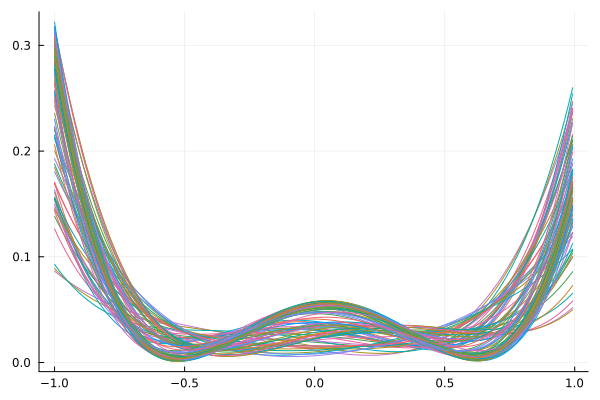

In [31]:
plot(xsL ,outsC0L; legend=:none)

In [42]:
xsHf, XtrainsHf, y_trainHf, outsC0Hf, outsC1Hf = vis_dist(SplitBasis("Hist Split Fourier"), 16)
xsHL, XtrainsHL, y_trainHL, outsC0HL, outsC1HL = vis_dist(SplitBasis("Hist Split Legendre"), 16)

xsH6f, XtrainsH6f, y_trainH6f, outsC0H6f, outsC1H6f = vis_dist(SplitBasis("Hist Split Fourier"), 6)
xsH6L, XtrainsH6L, y_trainH6L, outsC0H6L, outsC1H6L = vis_dist(SplitBasis("Hist Split Legendre"), 6)

Generating initial weight MPS with bond dimension χ_init = 4
        using random state 456.
Initialising train states.
Classes are not Balanced:
┌───────┬───────┐
│ Class │ Count │
├───────┼───────┤
│     0 │    31 │
│     1 │    69 │
└───────┴───────┘
Initialising valid states.
Classes are not Balanced:
┌───────┬───────┐
│ Class │ Count │
├───────┼───────┤
│     0 │     3 │
│     1 │     7 │
└───────┴───────┘
Initialising test states.
Classes are not Balanced:
┌───────┬───────┐
│ Class │ Count │
├───────┼───────┤
│     0 │    36 │
│     1 │    64 │
└───────┴───────┘
Initialising test_enc states.
Classes are not Balanced:
┌───────┬───────┐
│ Class │ Count │
├───────┼───────┤
│     0 │    31 │
│     1 │    69 │
└───────┴───────┘
Using 1 iterations per update.
Validation MSE loss: 0.5 | Validation acc. 0.8.
Training MSE loss: 0.5 | Training acc. 0.54.
Testing MSE loss: 0.5 | Testing acc. 0.51.

Validation KL Divergence: 277.7437801445039.
Training KL Divergence: 278.75478052711424.
Test

6-element Vector{Array}:
 [-1.0, -0.98998998998999, -0.97997997997998, -0.96996996996997, -0.95995995995996, -0.94994994994995, -0.93993993993994, -0.92992992992993, -0.91991991991992, -0.9099099099099099  …  0.9019019019019019, 0.9119119119119119, 0.9219219219219219, 0.9319319319319319, 0.9419419419419419, 0.9519519519519519, 0.9619619619619619, 0.9719719719719719, 0.9819819819819819, 0.991991991991992]
 [-0.2141544548310621 -0.5969859761991643 … 0.36647645498124626 0.3888753108520462; 0.47632277389242894 0.9370596254987829 … -0.06453787936261213 0.04931970773221739; … ; 0.14338051625784431 0.16372869042913418 … 0.24905905094306768 0.10846194609053472; 0.2079838219974357 0.7708775915462436 … -0.3543696459912383 -0.23286450396021674]
 [0, 0, 1, 1, 1, 1, 1, 1, 0, 1  …  1, 0, 1, 0, 1, 1, 1, 1, 0, 1]
 [0.0014627132865706125 0.0030902028435664556 … 0.0010907416167233596 0.0010906489410037726; 0.005703687215861848 0.012100978102036235 … 0.004261619887775762 0.004228426932306885; … ; 0.05826

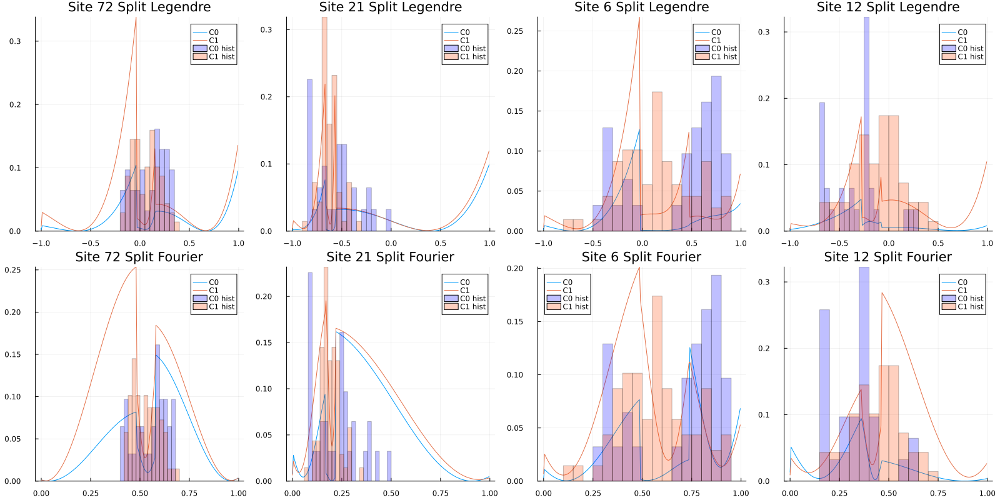

In [45]:
sites = sample(1:96, 4)
p1s = []
p2s = []
for siteid in sites
    bins=20
    distC0H6L = outsC0H6L[:,siteid]
    distC1H6L = outsC1H6L[:,siteid]

    dpointsH6L = XtrainsH6L[:, siteid]

    distC0H6f = outsC0H6f[:,siteid]
    distC1H6f = outsC1H6f[:,siteid]

    dpointsH6f = XtrainsH6f[:, siteid]
    
    p1 = plot(xsH6L, distC0H6L, label="C0", title="Site $siteid Split Legendre") 
    plot!(xsH6L, distC1H6L, label="C1") 
    histogram!(dpointsH6L[y_trainH6L .== 0], norm=:probability, alpha=0.25, bins=bins, label="C0 hist", color=:blue)
    histogram!(dpointsH6L[y_trainH6L .== 1], norm=:probability, alpha=0.25, bins=bins, label="C1 hist", color=:orangered)

    p2 = plot(xsH6f, distC0H6f, label="C0", title="Site $siteid Split Fourier") 
    plot!(xsH6f, distC1H6f, label="C1") 
    histogram!(dpointsH6f[y_trainH6f .== 0], norm=:probability, alpha=0.25, bins=bins, label="C0 hist", color=:blue)
    histogram!(dpointsH6f[y_trainH6f .== 1], norm=:probability, alpha=0.25, bins=bins, label="C1 hist", color=:orangered)
    #scatter!(dpoints, y_train, label="datapoints")

    push!(p1s, p1)
    push!(p2s, p2)
end

plot(p1s..., p2s..., layout = (2, 4), size=(1600,800))


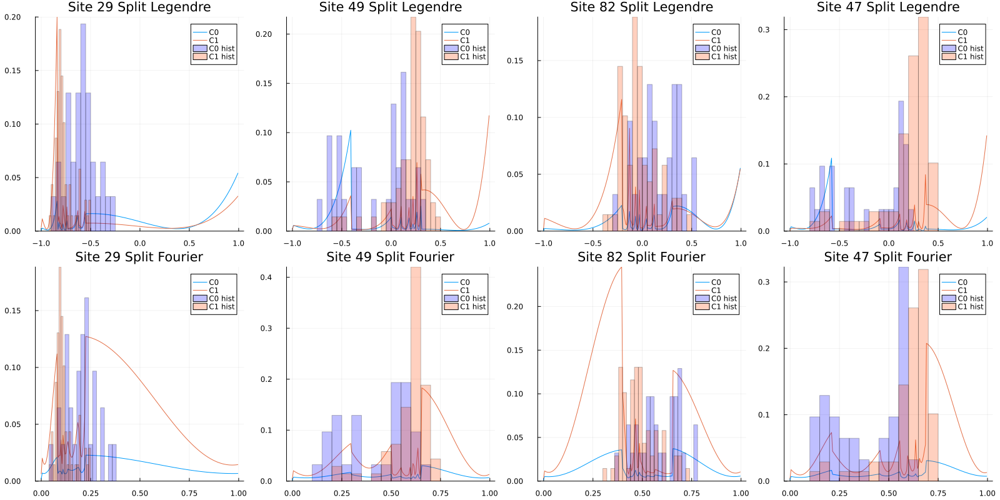

In [46]:
sites = sample(1:96, 4)
p1s = []
p2s = []
for siteid in sites
    bins=20
    distC0HL = outsC0HL[:,siteid]
    distC1HL = outsC1HL[:,siteid]

    dpointsHL = XtrainsHL[:, siteid]

    distC0Hf = outsC0Hf[:,siteid]
    distC1Hf = outsC1Hf[:,siteid]

    dpointsHf = XtrainsHf[:, siteid]
    
    p1 = plot(xsHL, distC0HL, label="C0", title="Site $siteid Split Legendre") 
    plot!(xsHL, distC1HL, label="C1") 
    histogram!(dpointsHL[y_trainHL .== 0], norm=:probability, alpha=0.25, bins=bins, label="C0 hist", color=:blue)
    histogram!(dpointsHL[y_trainHL .== 1], norm=:probability, alpha=0.25, bins=bins, label="C1 hist", color=:orangered)

    p2 = plot(xsHf, distC0Hf, label="C0", title="Site $siteid Split Fourier") 
    plot!(xsHf, distC1Hf, label="C1") 
    histogram!(dpointsHf[y_trainHf .== 0], norm=:probability, alpha=0.25, bins=bins, label="C0 hist", color=:blue)
    histogram!(dpointsHf[y_trainHf .== 1], norm=:probability, alpha=0.25, bins=bins, label="C1 hist", color=:orangered)
    #scatter!(dpoints, y_train, label="datapoints")

    push!(p1s, p1)
    push!(p2s, p2)
end

plot(p1s..., p2s..., layout = (2, 4), size=(1600,800))


In [27]:
xs

-1.0:0.020202020202020204:1.0

In [16]:
hists = [histogram(x,bins=20, xlims=[0,1]) for x in eachcol(X_train_scaled)];

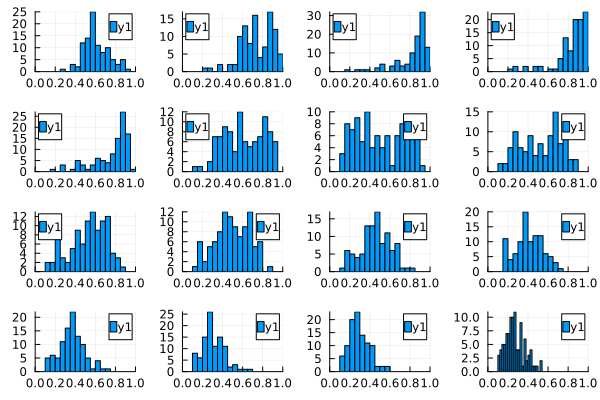

In [17]:
plot(hists[1:16]...)

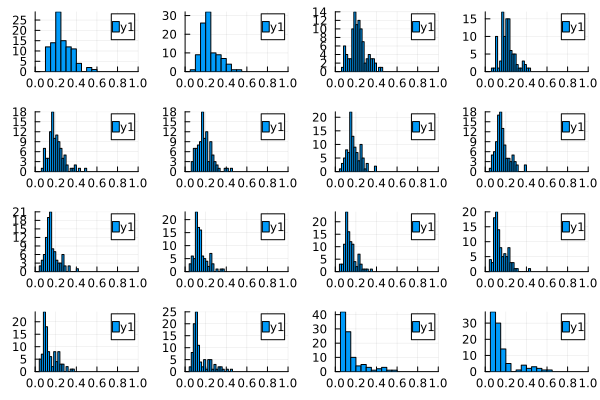

In [94]:
plot(hists[17:32]...)

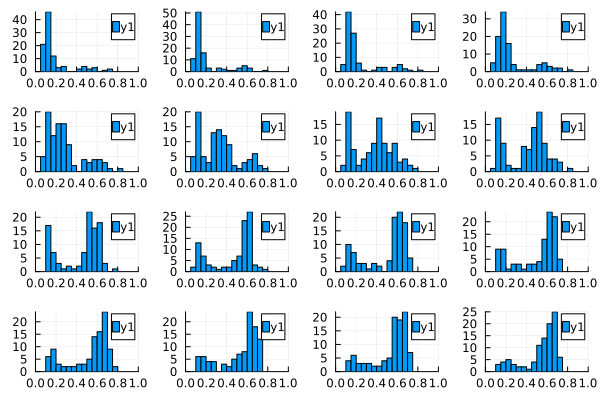

In [95]:
plot(hists[33:48]...)

In [97]:
xs = -1:1/500:1

ds = 1:5
pls = []
for i in ds
    global ys = [Pl(x, i; norm = Val(:normalized)) for x in xs]
    push!(pls, plot(xs,ys))
end

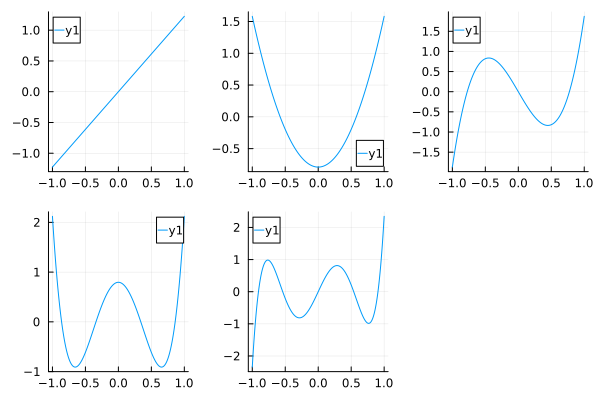

In [98]:
plot(pls...)

In [99]:
i = 1
ys =  [Pl(x, i; norm = Val(:normalized)) for x in xs]

1001-element Vector{Float64}:
 -1.224744871391589
 -1.2222953816488058
 -1.2198458919060227
 -1.2173964021632393
 -1.2149469124204562
 -1.212497422677673
 -1.2100479329348899
 -1.2075984431921067
 -1.2051489534493236
 -1.2026994637065402
  ⋮
  1.2051489534493236
  1.2075984431921067
  1.2100479329348899
  1.212497422677673
  1.2149469124204562
  1.2173964021632393
  1.2198458919060227
  1.2222953816488058
  1.224744871391589

In [100]:
function plot_hists(data,bins)
    nbins = length(bins) - 1
    h1 = histogram(data,bins=0:1/nbins:1, xlim=[0,1], title="Base Hist",color=:red,)
    scatter!(data,[5 for _ in data], label="Raw Data", color=:black, markershape=:xcross, legend=:none)
    
    h2 = histogram(data, bins=bins, xlim=[0,1], label="Scaled", title = "Scaled Hist")
    scatter!(data,[5 for _ in data], label="Raw Data", color=:black, markershape=:xcross, legend=:none)
    return plot(h1,h2, layout=(2,1), size=(600,400))
end

function make_bins_old(data, nbins)
    npt = length(data)
    A = sort(data)
    A_x = 0:(npt-1)
    nodes = (A_x,)
    itp = interpolate(nodes, A, Gridded(Linear()));
    xs = collect(0:npt/(nbins):(npt-1))
    bins = [itp(x) for x in xs]
    bins[1] = 0
    bins[end] = 1
    return bins
end

function make_bins(data, nbins)
    npts = length(data)
    bin_pts = Int(round(npts/nbins))

    bins = Vector{eltype(data)}(undef, nbins+1)
    bins[1] = 0
    j = 2
    ds = sort(data)
    for (i,x) in enumerate(ds)
        if i % bin_pts == 0 && i < length(data)
            bins[j] = (x + ds[i+1])/2
            j += 1
        end
    end
    bins[end] = 1
    return bins
end

make_bins (generic function with 1 method)

In [101]:
nbins = 12
bins = [make_bins(x,nbins) for x in eachcol(X_train_scaled)];
# bins2 = [make_bins(x,nbins) for x in eachrow(X_train_scaled)];

96-element Vector{Vector{Float64}}:
 [0.0, 0.4626533312809879, 0.4918833282117999, 0.5237239373670877, 0.552374560189385, 0.5723077005812836, 0.5868393111842196, 0.5959206057938569, 0.6253363725630623, 0.6880390443404442, 0.7301191047118321, 0.7676057864647986, 1.0]
 [0.0, 0.5427625188452322, 0.5929780441140786, 0.6366821552395939, 0.6573188696193668, 0.7093870840669959, 0.7322841015027136, 0.758830960441989, 0.8459566216677834, 0.8705881678560474, 0.890123807976884, 0.9240495955130557, 1.0]
 [0.0, 0.535113006660623, 0.6847199580691514, 0.7734837561689982, 0.8333156046588692, 0.8579682008443086, 0.8801054307641953, 0.9042129586376377, 0.9190839874533028, 0.9280999577324336, 0.9348358210431296, 0.9573913188258243, 1.0]
 [0.0, 0.5104925845935906, 0.7492544789072644, 0.7868493836377908, 0.812443098067662, 0.8600377923139906, 0.8875038055033533, 0.8990227729701746, 0.9117514986269986, 0.9308227976875639, 0.9537571643420129, 0.9628287202907377, 1.0]
 [0.0, 0.4293768821543973, 0.569937540470

In [102]:
bins[1]

13-element Vector{Float64}:
 0.0
 0.4626533312809879
 0.4918833282117999
 0.5237239373670877
 0.552374560189385
 0.5723077005812836
 0.5868393111842196
 0.5959206057938569
 0.6253363725630623
 0.6880390443404442
 0.7301191047118321
 0.7676057864647986
 1.0

In [103]:
plts = [plot_hists(x,bins[i]) for (i,x) in enumerate(eachcol(X_train_scaled))];
# plts2 = [plot_hists(x,bins2[i]) for (i,x) in enumerate(eachrow(X_train_scaled))];

96-element Vector{Plots.Plot{Plots.GRBackend}}:
 Plot{Plots.GRBackend() n=4}
 Plot{Plots.GRBackend() n=4}
 Plot{Plots.GRBackend() n=4}
 Plot{Plots.GRBackend() n=4}
 Plot{Plots.GRBackend() n=4}
 Plot{Plots.GRBackend() n=4}
 Plot{Plots.GRBackend() n=4}
 Plot{Plots.GRBackend() n=4}
 Plot{Plots.GRBackend() n=4}
 Plot{Plots.GRBackend() n=4}
 ⋮
 Plot{Plots.GRBackend() n=4}
 Plot{Plots.GRBackend() n=4}
 Plot{Plots.GRBackend() n=4}
 Plot{Plots.GRBackend() n=4}
 Plot{Plots.GRBackend() n=4}
 Plot{Plots.GRBackend() n=4}
 Plot{Plots.GRBackend() n=4}
 Plot{Plots.GRBackend() n=4}
 Plot{Plots.GRBackend() n=4}

In [104]:
bins[1]

13-element Vector{Float64}:
 0.0
 0.4626533312809879
 0.4918833282117999
 0.5237239373670877
 0.552374560189385
 0.5723077005812836
 0.5868393111842196
 0.5959206057938569
 0.6253363725630623
 0.6880390443404442
 0.7301191047118321
 0.7676057864647986
 1.0

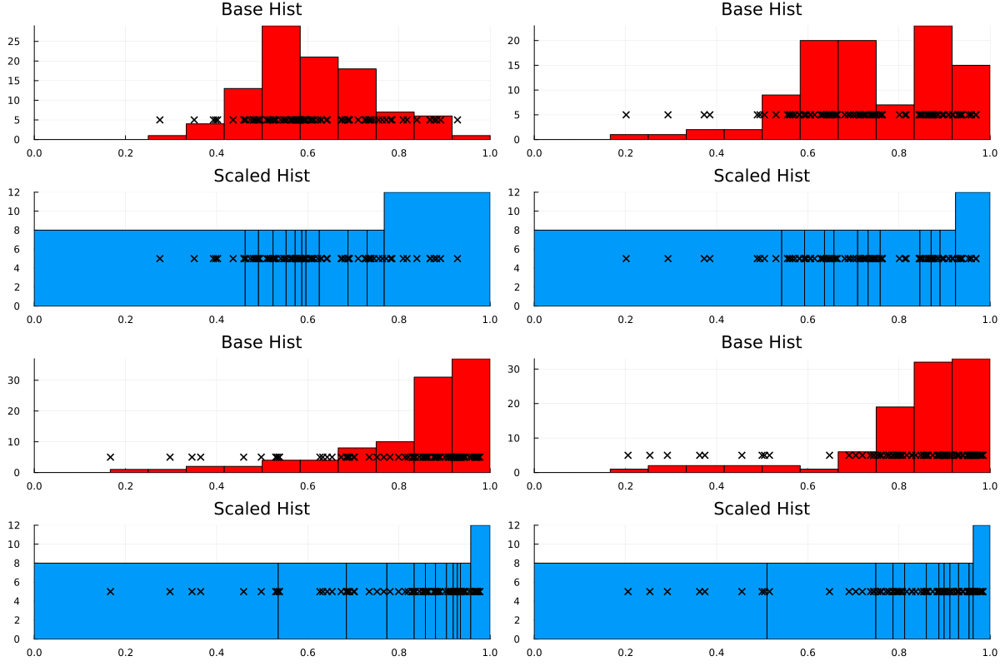

In [105]:
plot(plts[1:4]..., size=(1200,800))

In [106]:
function rect(x)
    return  abs(x) == 1/2 ? 1/2 : float(-0.5 < x < 0.5)
end

rect (generic function with 1 method)

In [107]:
function generate_rectbasis(bins::Vector{Float64}; aux::Union{Function, Vector{Function}}=identity)
    widths = diff(bins)
    if aux isa Function
        return x -> [rect((x - bins[i])/dx - 0.5)/dx for (i,dx) in enumerate(widths)]
    else
        x -> vcat([[rect((x - bins[i])/dx - 0.5)/dx * f((x-bins[i])/dx) for f in aux] for (i,dx) in enumerate(widths)]...)
    end
end

generate_rectbasis (generic function with 1 method)

In [109]:
xs = 0:1/500:1

aux = [x->1,x->cospi(2*x), x->sinpi(2*x)]

ys = Matrix{Float64}(undef, length(xs), length(aux)*(length(bins[1]) - 1))

for i in 1:size(ys,1)
    ys[i,:] = generate_rectbasis(bins[1]; aux=aux).(xs)[i]
end
#p = plot(xs, ys)


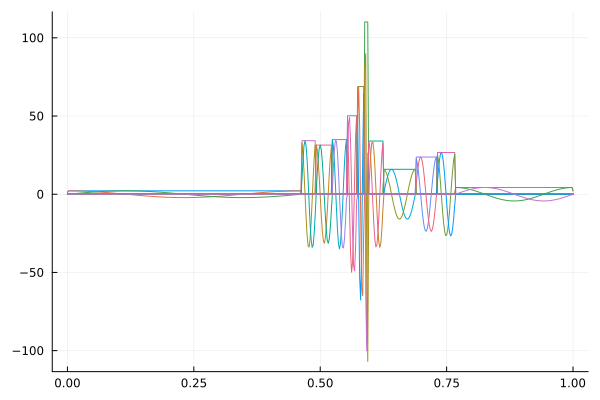

In [110]:
plot(xs,ys, legend=:none)

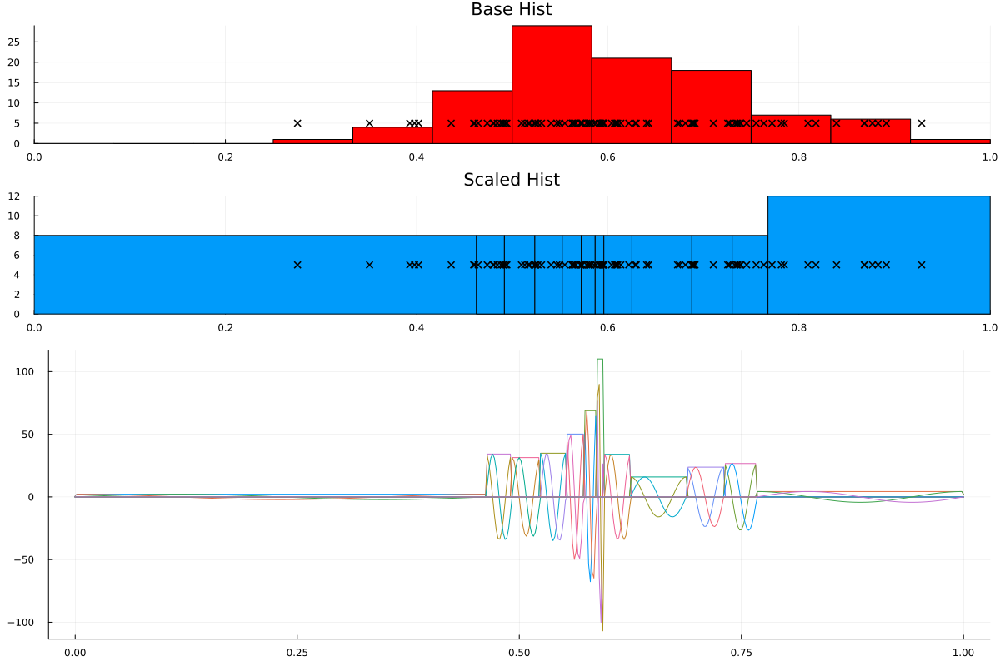

In [112]:
plot(plts[1], plot(xs,ys,legend=:none),layout=(2,1),size=(1200,800))


In [8]:
(X_train, y_train), (X_val, y_val), (X_test, y_test) = load_splits_txt("../datasets/ECG_train.txt", 
"../datasets/ECG_val.txt", "../datasets/ECG_test.txt");
X_train = vcat(X_train, X_val);
y_train = vcat(y_train, y_val);



setprecision(BigFloat, 128)
Rdtype = Float64

verbosity = 0
test_run = true


opts=Options(; nsweeps=5, chi_max=15,  update_iters=1, verbosity=verbosity, dtype=Complex{Rdtype}, lg_iter=KLD_iter,
bbopt=BBOpt("CustomGD"), track_cost=false, eta=0.05, rescale = (false, true), d=10, aux_basis_dim=1, encoding=SplitBasis("Hist Split", "Uniform"))

W, info, train_states, test_states, p = fitMPS(X_train, y_train, X_val, y_val, X_test, y_test; random_state=456, chi_init=4, opts=opts, test_run=test_run)



Generating initial weight MPS with bond dimension χ_init = 4
        using random state 456.


┌ Warning: Using a complex valued MPS but the encoding is real
└ @ Main /home/noodles/Documents/QML Project/QuantumInspiredML/LogLoss/RealRealHighDimension.jl:501


Initialising train states.
Initialising valid states.
Initialising test states.
Initialising test_enc states.
Encoding completed! Returning initial states without training.


(MPS
[1] ((dim=10|id=287|"Site,n=1"), (dim=4|id=453|"Link,l=1"))
[2] ((dim=10|id=238|"Site,n=2"), (dim=4|id=453|"Link,l=1"), (dim=4|id=50|"Link,l=2"))
[3] ((dim=10|id=557|"Site,n=3"), (dim=4|id=50|"Link,l=2"), (dim=4|id=79|"Link,l=3"))
[4] ((dim=10|id=383|"Site,n=4"), (dim=4|id=79|"Link,l=3"), (dim=4|id=295|"Link,l=4"))
[5] ((dim=10|id=539|"Site,n=5"), (dim=4|id=295|"Link,l=4"), (dim=4|id=743|"Link,l=5"))
[6] ((dim=10|id=185|"Site,n=6"), (dim=4|id=743|"Link,l=5"), (dim=4|id=345|"Link,l=6"))
[7] ((dim=10|id=90|"Site,n=7"), (dim=4|id=345|"Link,l=6"), (dim=4|id=648|"Link,l=7"))
[8] ((dim=10|id=291|"Site,n=8"), (dim=4|id=648|"Link,l=7"), (dim=4|id=973|"Link,l=8"))
[9] ((dim=10|id=116|"Site,n=9"), (dim=4|id=973|"Link,l=8"), (dim=4|id=42|"Link,l=9"))
[10] ((dim=10|id=858|"Site,n=10"), (dim=4|id=42|"Link,l=9"), (dim=4|id=127|"Link,l=10"))
[11] ((dim=10|id=674|"Site,n=11"), (dim=4|id=127|"Link,l=10"), (dim=4|id=384|"Link,l=11"))
[12] ((dim=10|id=260|"Site,n=12"), (dim=4|id=384|"Link,l=11"), (d

In [9]:
siteinds(W)

96-element Vector{Index{Int64}}:
 (dim=10|id=287|"Site,n=1")
 (dim=10|id=238|"Site,n=2")
 (dim=10|id=557|"Site,n=3")
 (dim=10|id=383|"Site,n=4")
 (dim=10|id=539|"Site,n=5")
 (dim=10|id=185|"Site,n=6")
 (dim=10|id=90|"Site,n=7")
 (dim=10|id=291|"Site,n=8")
 (dim=10|id=116|"Site,n=9")
 (dim=10|id=858|"Site,n=10")
 ⋮
 (dim=10|id=72|"Site,n=88")
 (dim=10|id=562|"Site,n=89")
 (dim=10|id=125|"Site,n=90")
 (dim=10|id=212|"Site,n=91")
 (dim=10|id=435|"Site,n=92")
 (dim=10|id=966|"Site,n=93")
 (dim=10|id=458|"Site,n=94")
 (dim=10|id=549|"Site,n=95")
 (dim=10|id=89|"Site,n=96")

In [32]:
# testing scaled by class
X0 = X_train_scaled[y_train .== 0,:]
X1 = X_train_scaled[y_train .== 1,:]

hists = [histogram(x,bins=20, xlims=[0,1], label="C1", norm=:probability) for x in eachcol(X0)];

hists = [histogram!(hists[i],x,bins=20, xlims=[0,1], label="C2", alpha=0.5, norm=:probability) for (i,x) in enumerate(eachcol(X1))];



In [34]:
X0

31×96 Matrix{Float64}:
 0.392923  0.201507  0.167083  0.253533  …  0.67553   0.683238  0.694438
 0.738161  0.96853   0.971721  0.950954     0.464994  0.467731  0.52466
 0.523998  0.504934  0.537928  0.705259     0.633027  0.649567  0.581152
 0.562844  0.530075  0.532995  0.647635     0.626006  0.671323  0.569606
 0.687541  0.654994  0.859665  0.951844     0.517288  0.56761   0.629571
 0.577877  0.693056  0.835774  0.901812  …  0.650997  0.646935  0.569907
 0.571453  0.628254  0.653271  0.744984     0.610879  0.606305  0.504783
 0.734832  0.867447  0.909727  0.931752     0.531816  0.577867  0.500957
 0.882749  0.894809  0.835145  0.853921     0.477603  0.493531  0.565446
 0.595972  0.712761  0.820034  0.91239      0.476651  0.518683  0.458197
 ⋮                                       ⋱                      ⋮
 0.55508   0.489229  0.345965  0.205618     0.69248   0.693512  0.677251
 0.71049   0.800975  0.766669  0.743874     0.831507  0.74763   0.545315
 0.523369  0.640769  0.734825  0.796

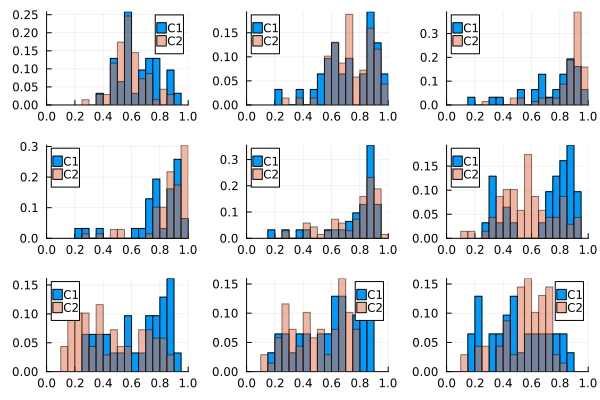

In [33]:
plot(hists[1:9]...)